# Import Essential Libraries

In [1]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.optim as optim
import torchvision
from torchvision import datasets, models
from torchvision import transforms as T
from torch.utils.data import DataLoader, Dataset
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import pandas as pd
from skimage import io, transform
import matplotlib.image as mpimg
from PIL import Image
from sklearn.metrics import roc_auc_score
import torch.nn.functional as F
import scipy
import random
import pickle
import scipy.io as sio
import itertools
from scipy.ndimage.interpolation import shift
import copy
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
plt.ion()

# Import Dataloader Class and other utilities

In [2]:
from dataloader_2d import *
from dataloader_3d import *

# Build Data loader objects

In [3]:
train_path = '/beegfs/ark576/Knee Cartilage Data/Train Data'
val_path = '/beegfs/ark576/Knee Cartilage Data/Validation Data'
test_path = '/beegfs/ark576/Knee Cartilage Data/Test Data'

train_file_names = sorted(pickle.load(open(train_path + '/train_file_names','rb')))
val_file_names = sorted(pickle.load(open(val_path + '/val_file_names','rb')))
test_file_names = sorted(pickle.load(open(test_path + '/test_file_names','rb')))

transformed_dataset = {'train': KneeMRI3DDataset(train_path,train_file_names, train_data= True, flipping=False, normalize= True),
                       'validate': KneeMRI3DDataset(val_path,val_file_names, normalize= True),
                       'test': KneeMRI3DDataset(test_path,test_file_names, normalize= True)
                                          }

dataloader = {x: DataLoader(transformed_dataset[x], batch_size=1,
                        shuffle=False, num_workers=0) for x in ['train', 'validate','test']}
data_sizes ={x: len(transformed_dataset[x]) for x in ['train', 'validate','test']}

In [5]:
im, segments,_ = next(iter(dataloader['train']))

# Import Models

In [6]:
from unet_3d import *
from unet_basic_dilated import *
from vnet import *
from ensemble_model import *

## Import Loss functions and all other utility functions like functions for saving models, for visualizing images, etc.

In [8]:
from utils import *

## Import all the Training and evaluate functions to evaluate the models

In [9]:
from train_2d import *
from train_3d import *
from train_ensemble import *
from evaluate_2d import *
from evaluate_3d import *
from evaluate_ensemble import *

# 1. Training a 3D Unet Model

In [17]:
unet3d_model = nn.DataParallel(Unet_3D(9,4)).cuda()

In [33]:
optimizer_3d = optim.Adam(unet3d_model.parameters(),lr = 1e-5)

In [34]:
unet3d_model, loss_hist, dc_hist_0, dc_hist_1, dc_hist_2 = train_model_3d(unet3d_model, optimizer_3d,dataloader,data_sizes,1,
                                                                num_epochs=50, verbose = False)

Epoch: 0, Phase: train, epoch loss: 0.0296, Dice Score (class 0): 0.8553, Dice Score (class 1): 0.6215,Dice Score (class 2): 0.8079
----------
Epoch: 0, Phase: validate, epoch loss: 0.4811, Dice Score (class 0): 0.6002, Dice Score (class 1): 0.3831,Dice Score (class 2): 0.6137
----------
Epoch: 10, Phase: train, epoch loss: 0.0283, Dice Score (class 0): 0.8587, Dice Score (class 1): 0.6256,Dice Score (class 2): 0.8162
----------
Epoch: 10, Phase: validate, epoch loss: 0.4747, Dice Score (class 0): 0.6227, Dice Score (class 1): 0.3765,Dice Score (class 2): 0.6049
----------
Epoch: 20, Phase: train, epoch loss: 0.0278, Dice Score (class 0): 0.8643, Dice Score (class 1): 0.6352,Dice Score (class 2): 0.8240
----------
Epoch: 20, Phase: validate, epoch loss: 0.4766, Dice Score (class 0): 0.6175, Dice Score (class 1): 0.3786,Dice Score (class 2): 0.5900
----------
Epoch: 30, Phase: train, epoch loss: 0.0273, Dice Score (class 0): 0.8678, Dice Score (class 1): 0.6392,Dice Score (class 2): 0.8

In [35]:
torch.save(unet3d_model,'unet3_D_3')
pickle.dump(loss_hist, open('loss_hist_unet3_D_3','wb'))
pickle.dump(dc_hist_0, open('dc_hist_0_unet3_D_3','wb'))
pickle.dump(dc_hist_1, open('dc_hist_1_unet3_D_3','wb'))
pickle.dump(dc_hist_2, open('dc_hist_2_unet3_D_3','wb'))

In [18]:
unet3d_model = torch.load('unet3_D_2')

True Map


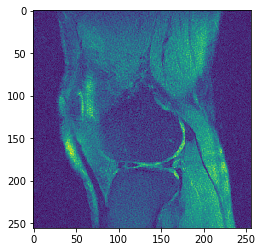

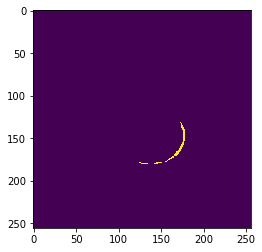

Predicted Map


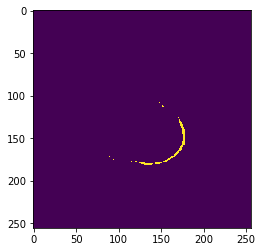

True Map


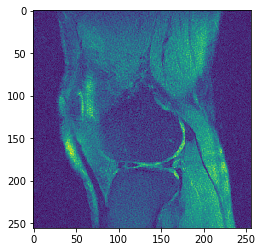

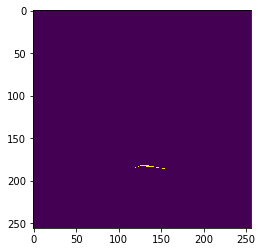

Predicted Map


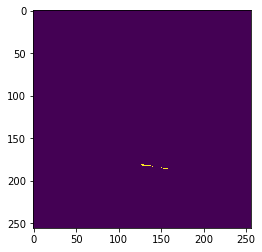

True Map


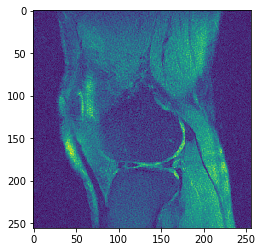

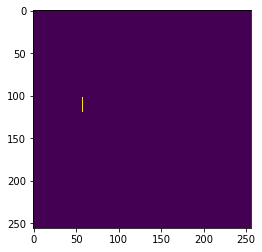

Predicted Map


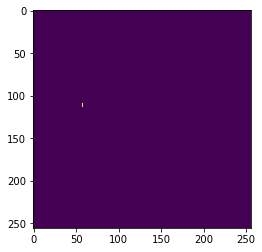

True Map


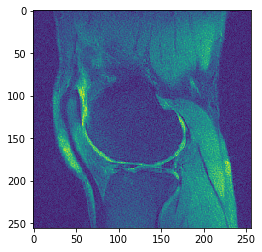

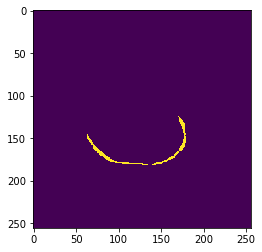

Predicted Map


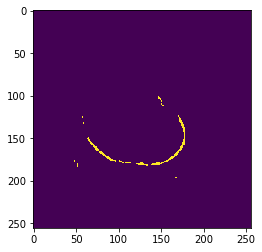

True Map


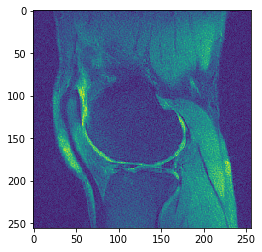

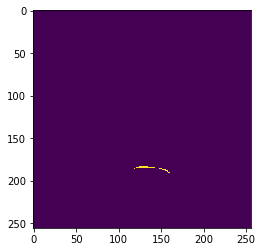

Predicted Map


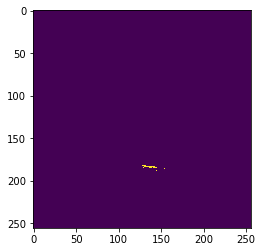

True Map


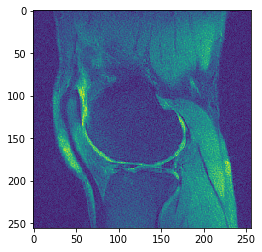

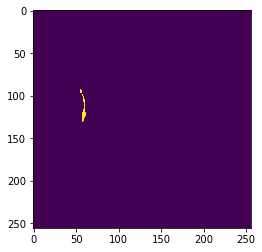

Predicted Map


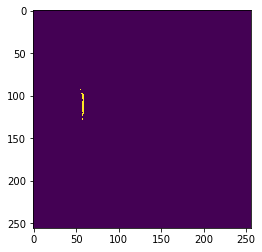

True Map


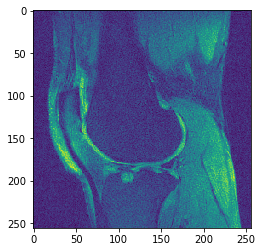

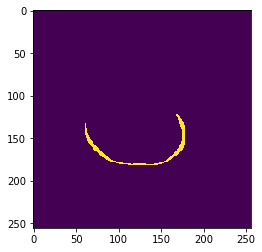

Predicted Map


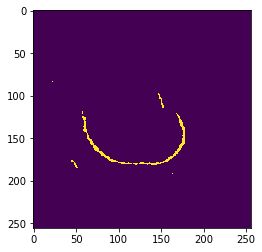

True Map


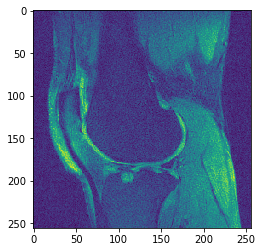

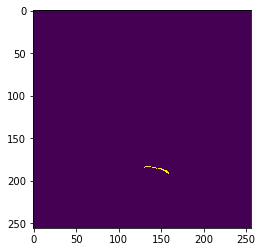

Predicted Map


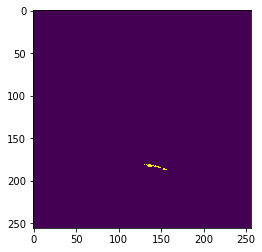

True Map


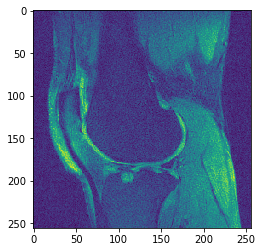

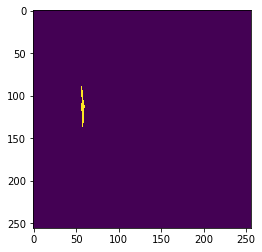

Predicted Map


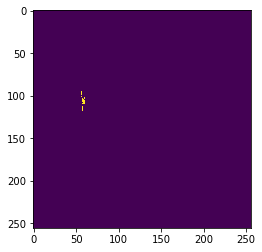

True Map


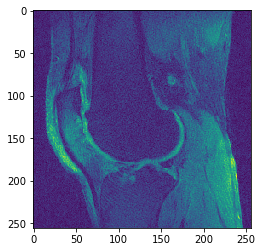

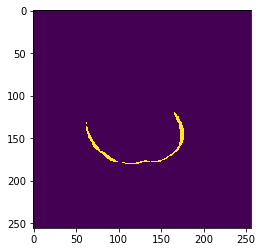

Predicted Map


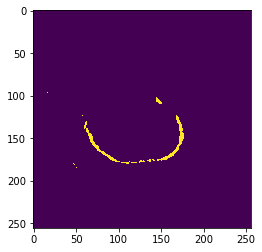

True Map


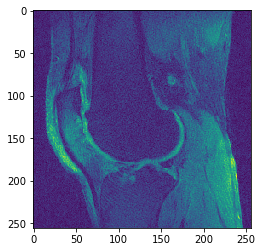

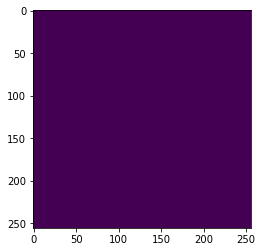

Predicted Map


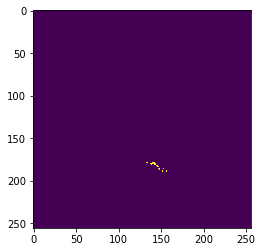

True Map


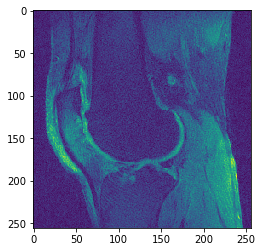

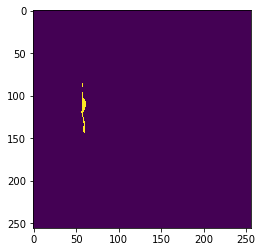

Predicted Map


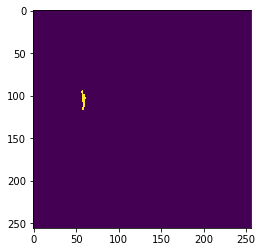

True Map


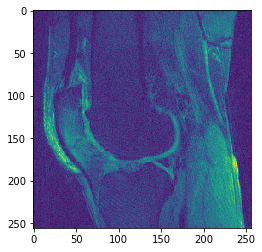

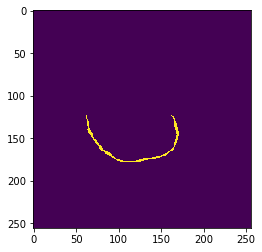

Predicted Map


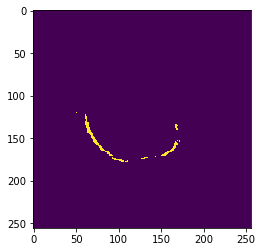

True Map


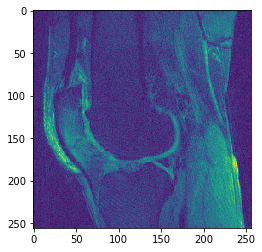

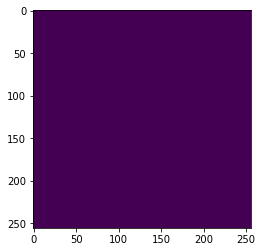

Predicted Map


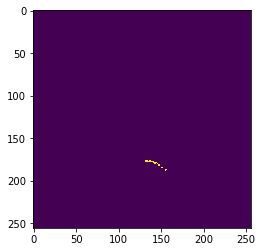

True Map


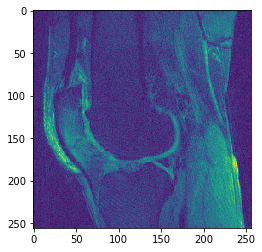

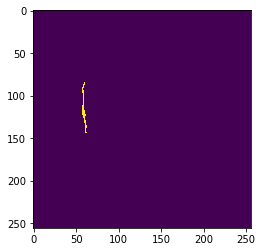

Predicted Map


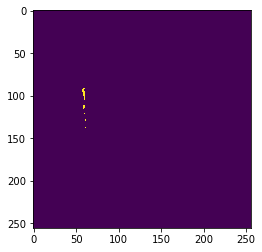

True Map


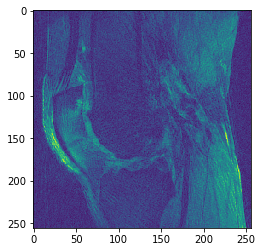

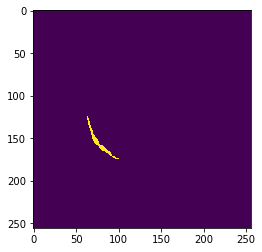

Predicted Map


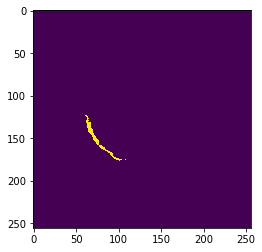

True Map


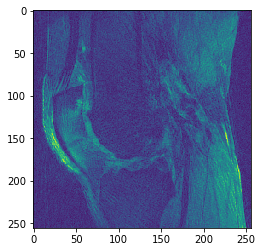

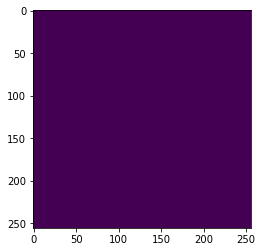

Predicted Map


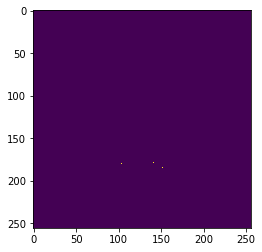

True Map


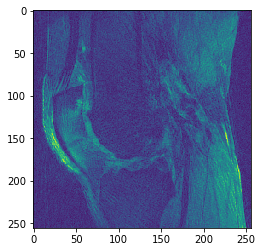

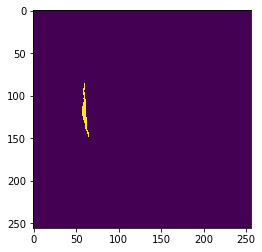

Predicted Map


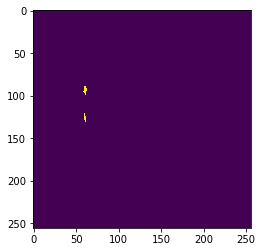

True Map


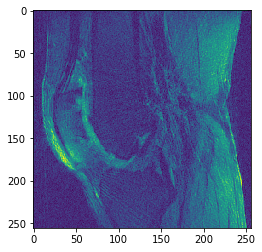

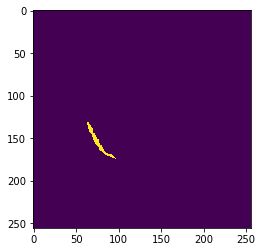

Predicted Map


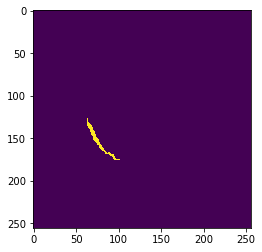

True Map


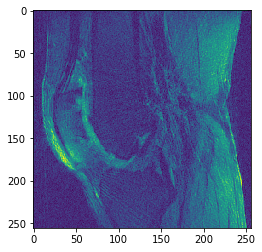

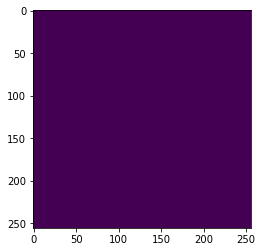

Predicted Map


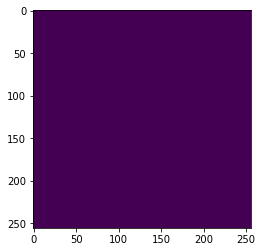

True Map


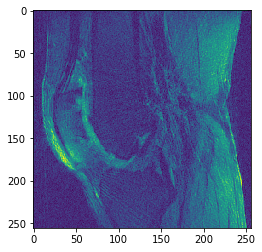

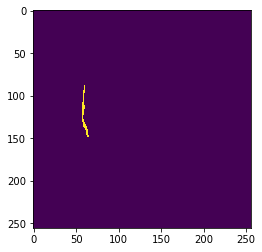

Predicted Map


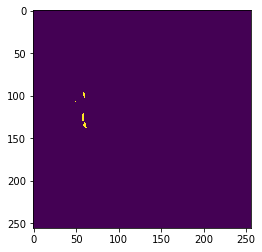

True Map


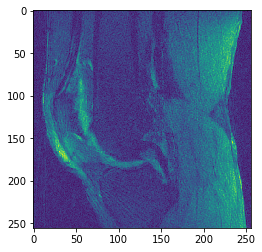

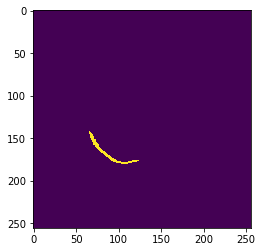

Predicted Map


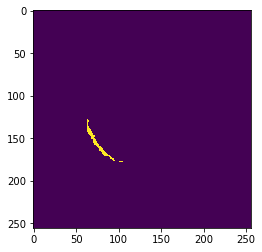

True Map


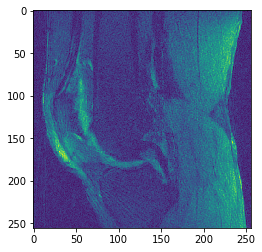

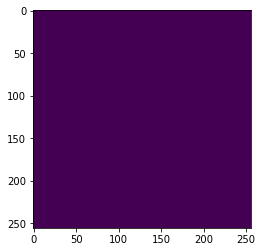

Predicted Map


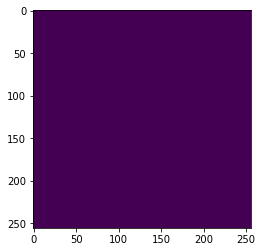

True Map


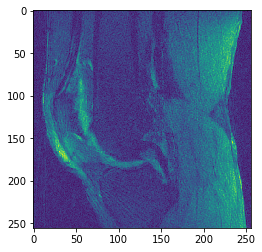

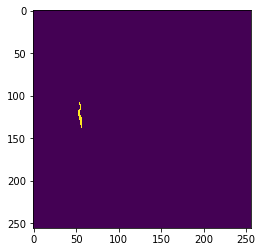

Predicted Map


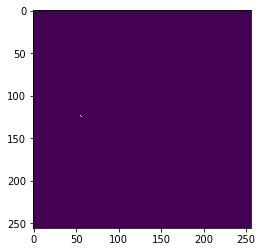

True Map


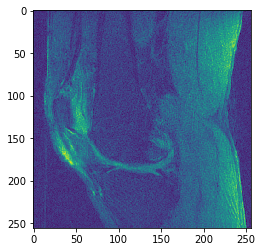

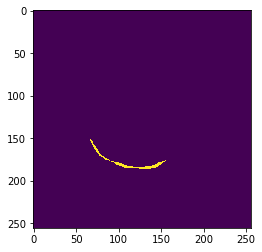

Predicted Map


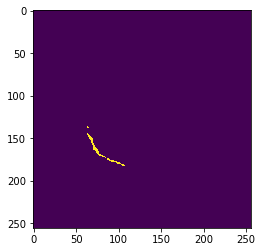

True Map


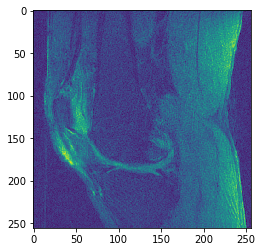

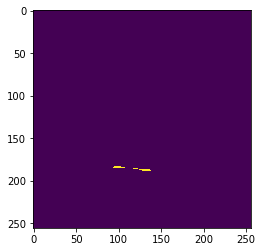

Predicted Map


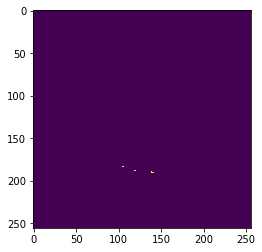

True Map


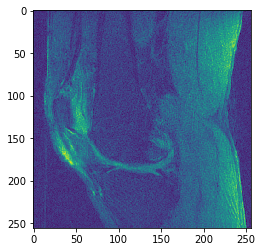

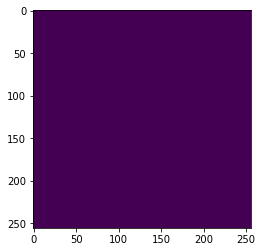

Predicted Map


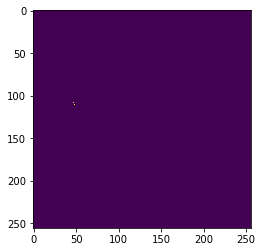

True Map


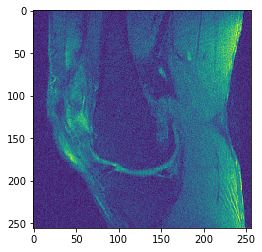

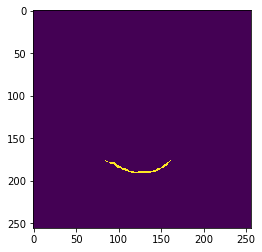

Predicted Map


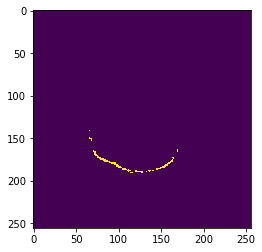

True Map


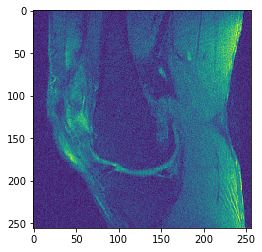

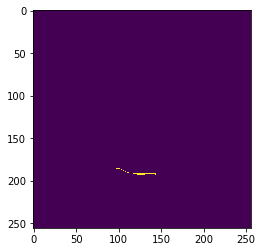

Predicted Map


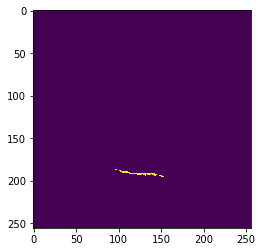

True Map


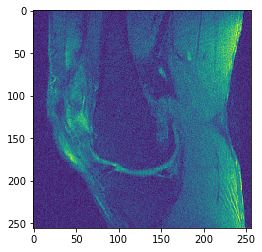

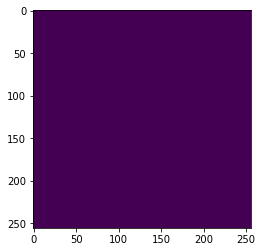

Predicted Map


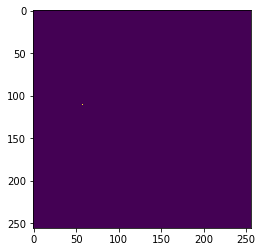

True Map


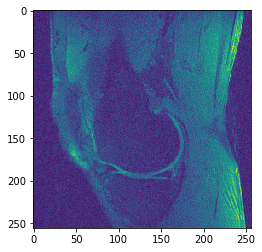

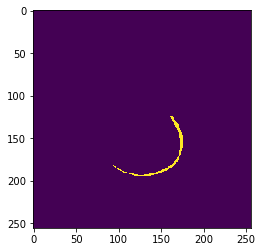

Predicted Map


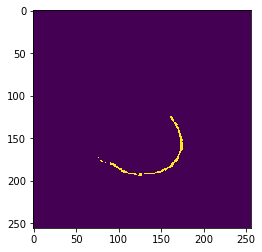

True Map


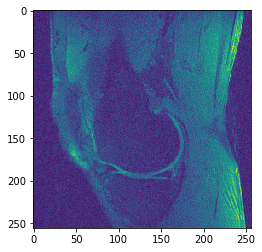

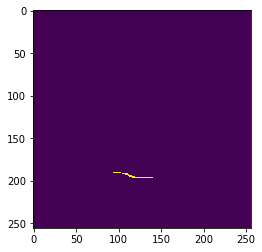

Predicted Map


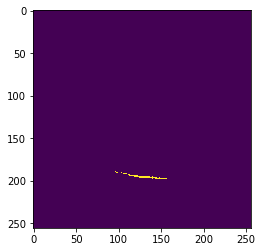

True Map


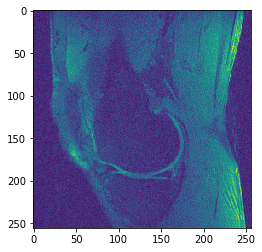

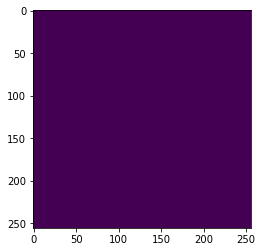

Predicted Map


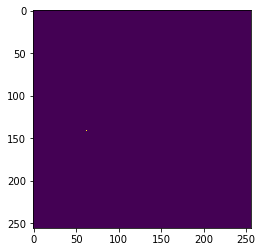

True Map


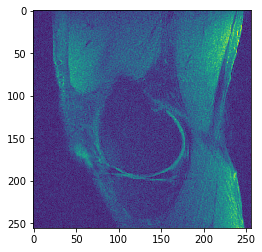

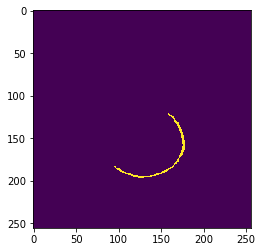

Predicted Map


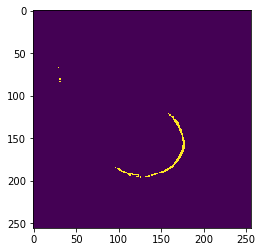

True Map


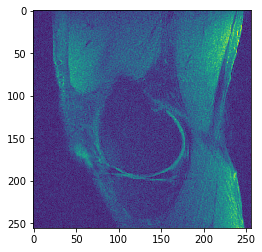

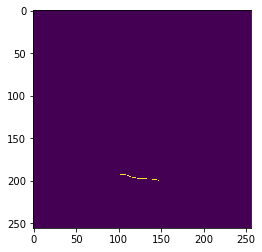

Predicted Map


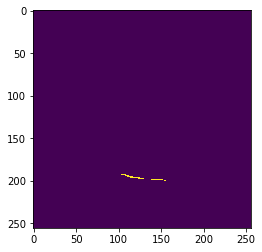

True Map


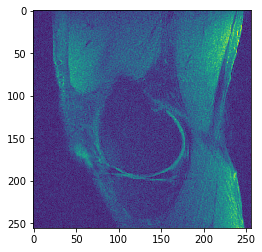

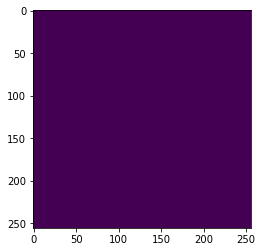

Predicted Map


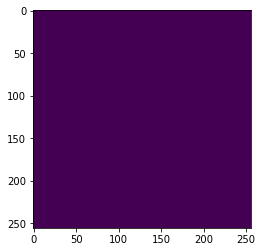

True Map


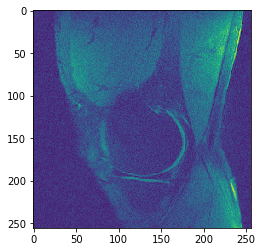

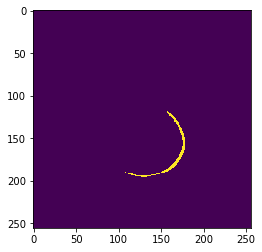

Predicted Map


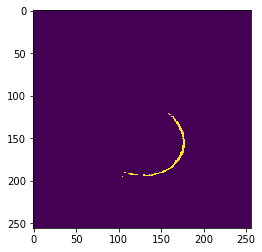

True Map


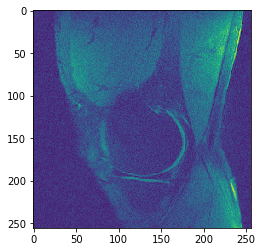

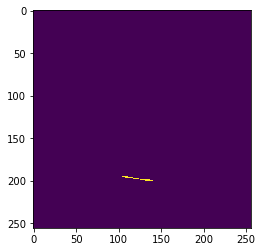

Predicted Map


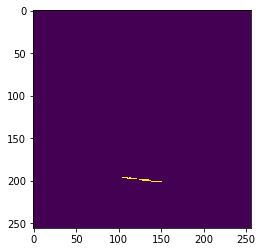

True Map


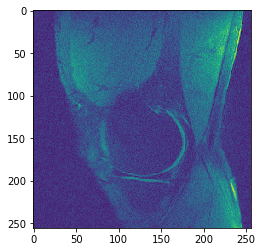

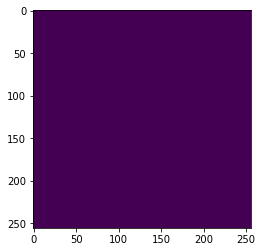

Predicted Map


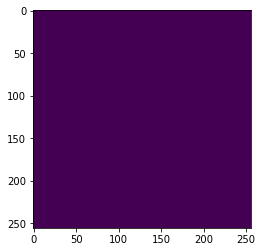

True Map


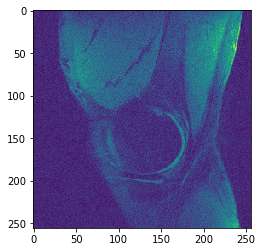

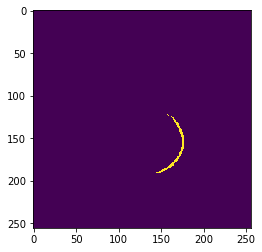

Predicted Map


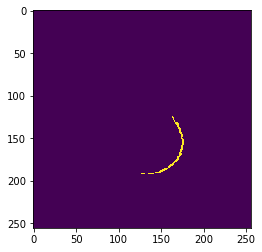

True Map


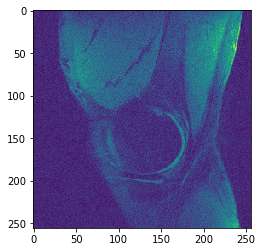

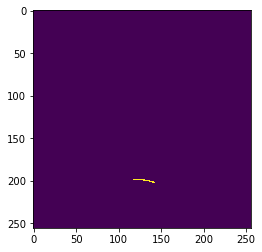

Predicted Map


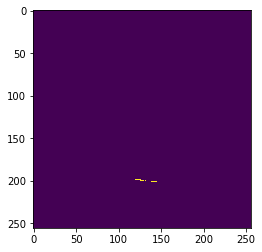

True Map


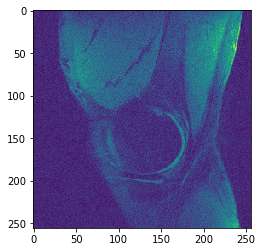

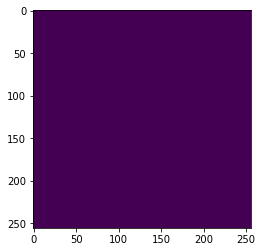

Predicted Map


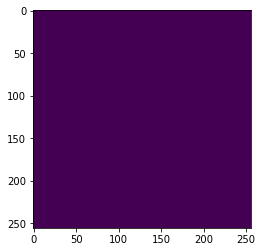

True Map


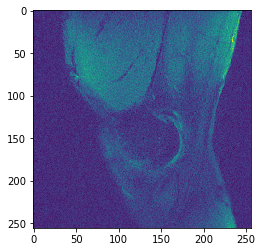

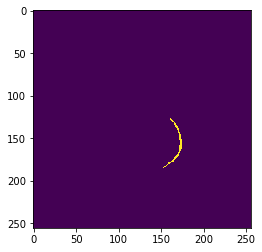

Predicted Map


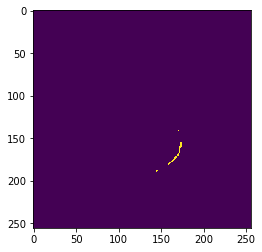

True Map


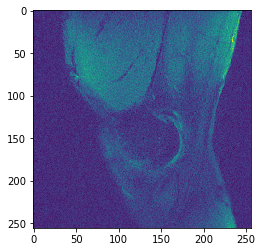

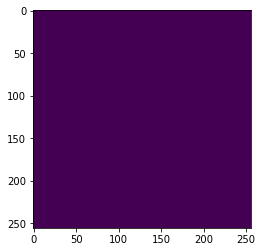

Predicted Map


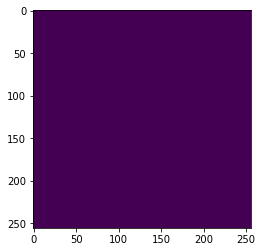

True Map


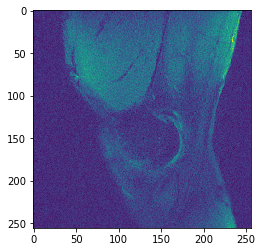

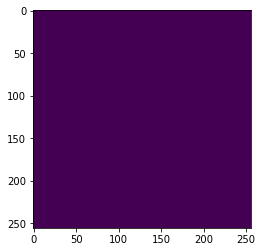

Predicted Map


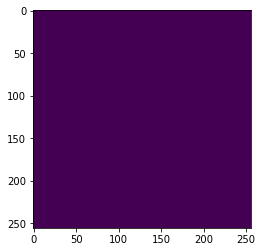

validate loss: 0.4729, Dice Score (class 0): 0.6185, Dice Score (class 1): 0.3784,Dice Score (class 2): 0.5973


(0.47285217472485136,
 0.6185200342110225,
 0.3783776078905378,
 0.5973164652075086)

In [28]:
evaluate_3d(unet3d_model, dataloader, data_sizes, 1, 'validate')

# Discussion
As it can be seen from the visualizing the prediction for the validation samples, the predictions are very grainy and the model is very conservative in the prediction. Additionally, the dice scores are not as good as 2d Models.

# 2. Training a V-Net Model (V-Net is a 3D convolutional model)

In [126]:
vnet_model = Vnet(9,4).cuda()

In [136]:
optimizer_vnet = optim.Adam(vnet_model.parameters(),lr = 7e-5)

In [139]:
vnet_model, loss_hist, dc_hist_0, dc_hist_1, dc_hist_2 = train_model_3d(vnet_model, optimizer_vnet,dataloader,data_sizes,1,
                                                                num_epochs= 100, verbose = False)

Epoch: 0, Phase: train, epoch loss: 0.2692, Dice Score (class 0): 0.1636, Dice Score (class 1): 0.7206,Dice Score (class 2): 0.3554
----------
Epoch: 0, Phase: validate, epoch loss: 0.7240, Dice Score (class 0): 0.0523, Dice Score (class 1): 0.4350,Dice Score (class 2): 0.1616
----------
Epoch: 10, Phase: train, epoch loss: 0.2575, Dice Score (class 0): 0.2189, Dice Score (class 1): 0.7235,Dice Score (class 2): 0.3501
----------
Epoch: 10, Phase: validate, epoch loss: 0.7024, Dice Score (class 0): 0.0920, Dice Score (class 1): 0.4127,Dice Score (class 2): 0.1516
----------
Epoch: 20, Phase: train, epoch loss: 0.2388, Dice Score (class 0): 0.2668, Dice Score (class 1): 0.7313,Dice Score (class 2): 0.3726
----------
Epoch: 20, Phase: validate, epoch loss: 0.6991, Dice Score (class 0): 0.1559, Dice Score (class 1): 0.4498,Dice Score (class 2): 0.1652
----------
Epoch: 30, Phase: train, epoch loss: 0.2214, Dice Score (class 0): 0.3287, Dice Score (class 1): 0.7226,Dice Score (class 2): 0.3

In [134]:
torch.save(vnet_model,'vnet_model_4')
pickle.dump(loss_hist, open('loss_hist_vnet_model_4','wb'))
pickle.dump(dc_hist_0, open('dc_hist_0_vnet_model_4','wb'))
pickle.dump(dc_hist_1, open('dc_hist_1_vnet_model_4','wb'))
pickle.dump(dc_hist_2, open('dc_hist_2_vnet_model_4','wb'))

In [24]:
vnet_model = torch.load('vnet_model_4')

True Map


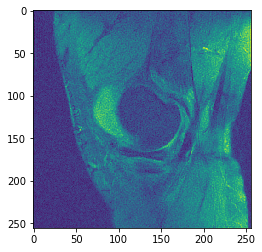

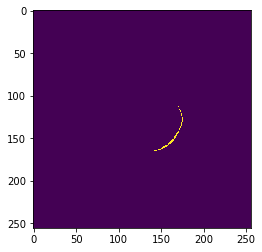

Predicted Map


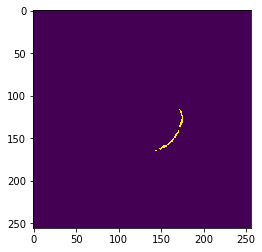

True Map


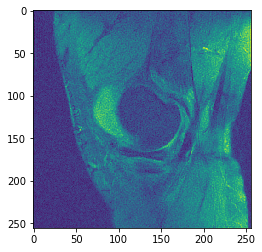

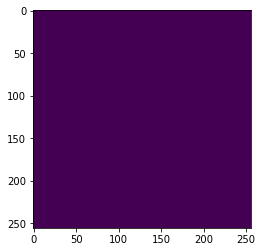

Predicted Map


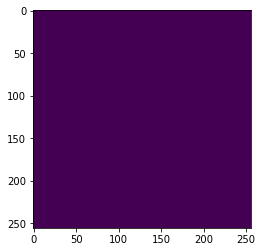

True Map


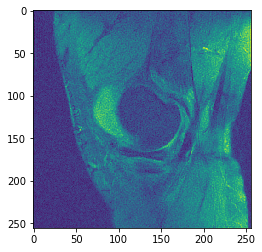

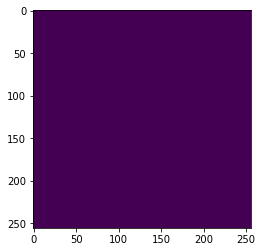

Predicted Map


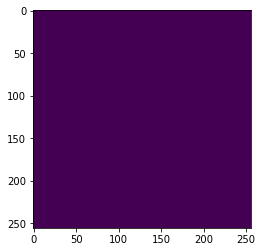

True Map


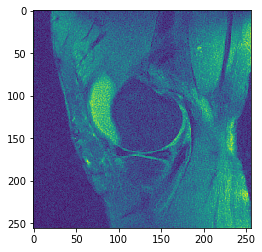

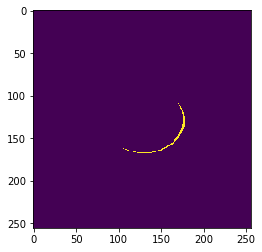

Predicted Map


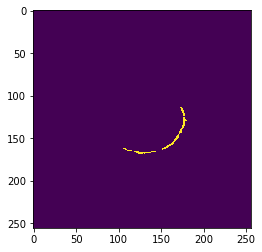

True Map


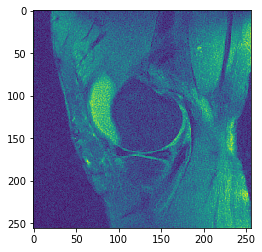

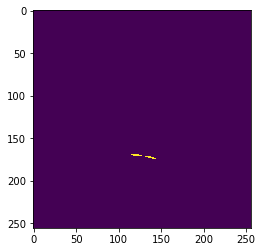

Predicted Map


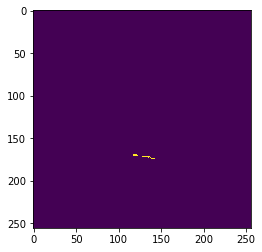

True Map


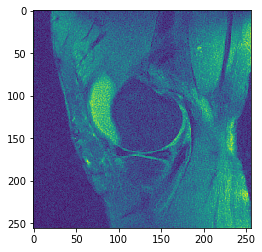

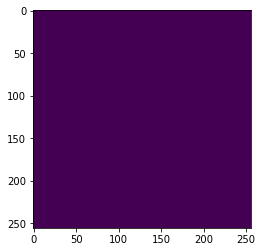

Predicted Map


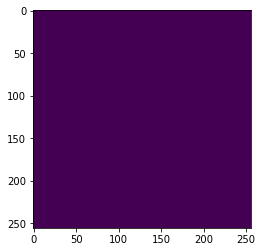

True Map


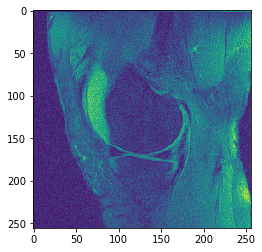

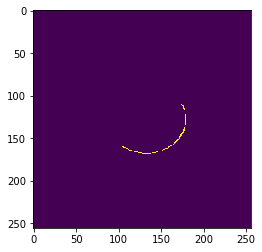

Predicted Map


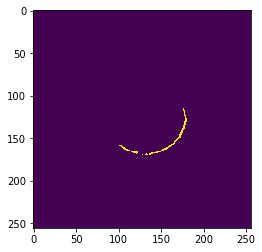

True Map


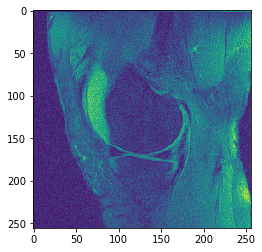

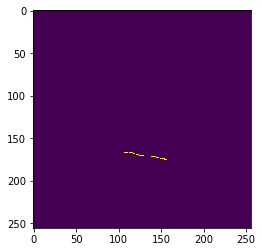

Predicted Map


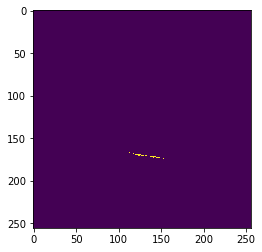

True Map


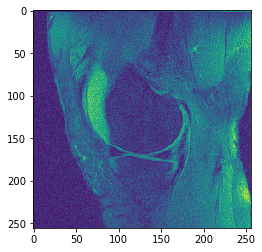

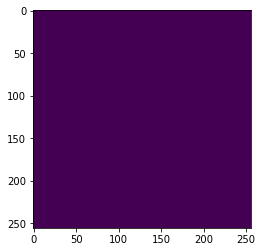

Predicted Map


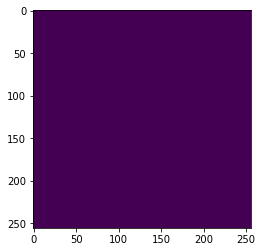

True Map


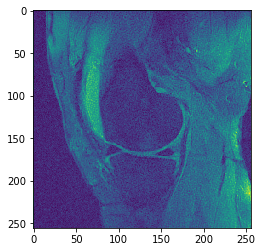

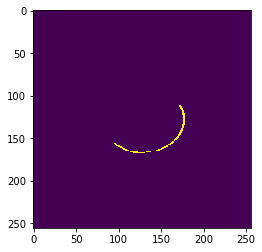

Predicted Map


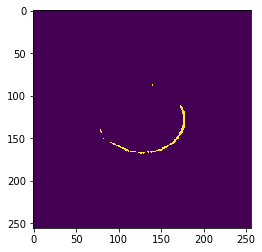

True Map


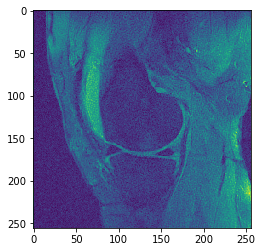

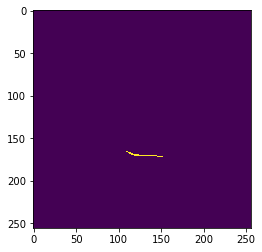

Predicted Map


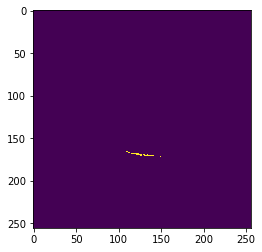

True Map


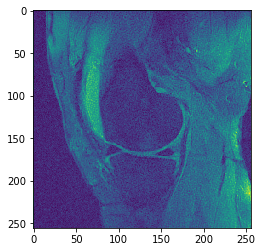

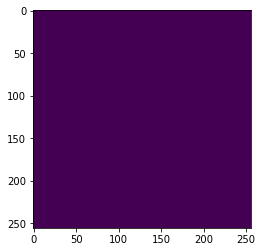

Predicted Map


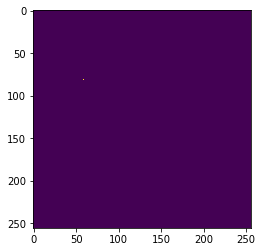

True Map


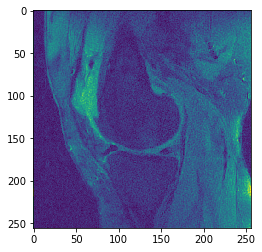

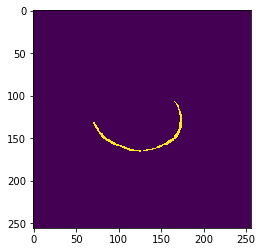

Predicted Map


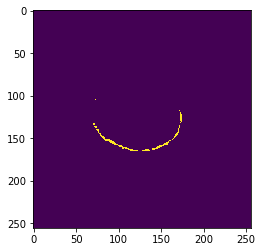

True Map


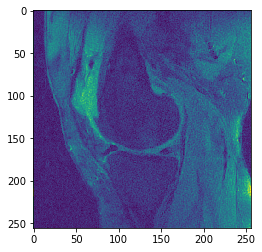

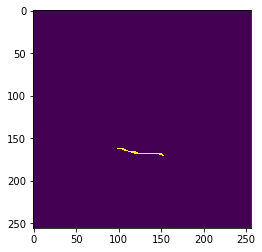

Predicted Map


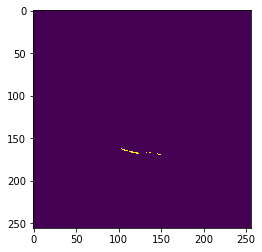

True Map


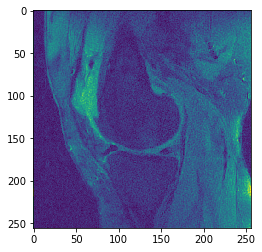

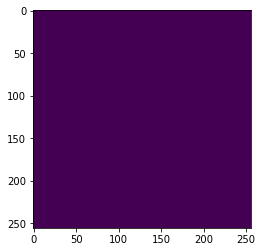

Predicted Map


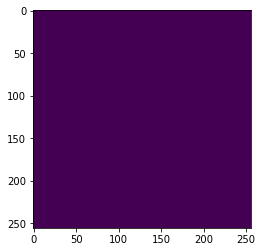

True Map


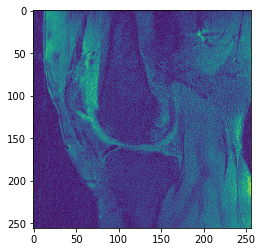

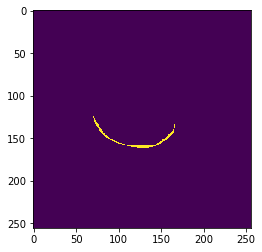

Predicted Map


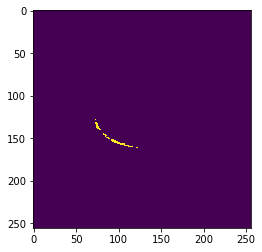

True Map


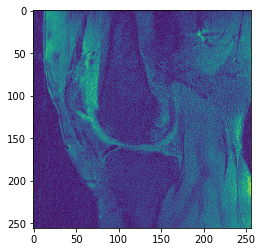

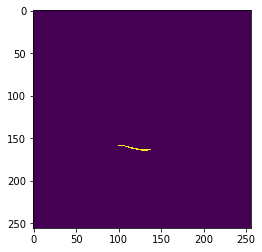

Predicted Map


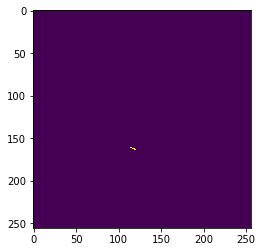

True Map


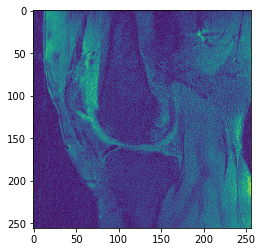

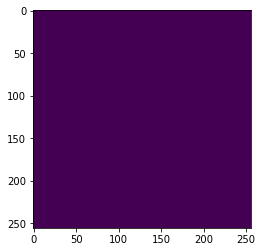

Predicted Map


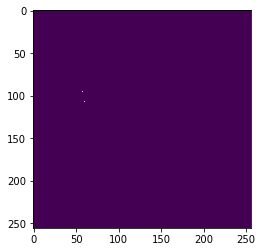

True Map


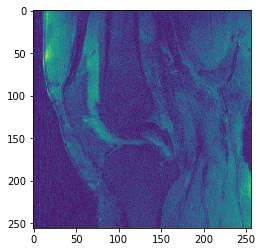

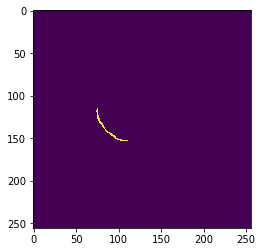

Predicted Map


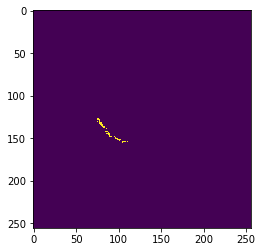

True Map


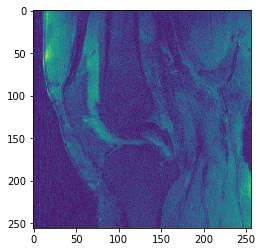

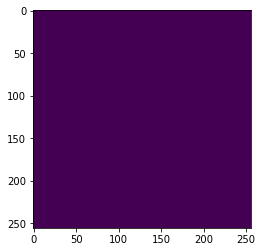

Predicted Map


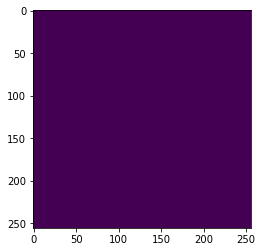

True Map


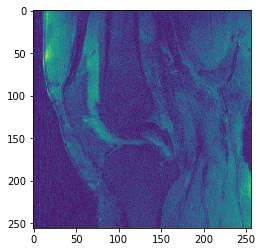

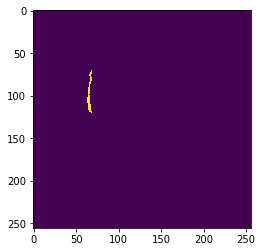

Predicted Map


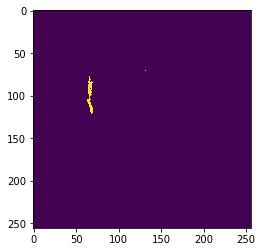

True Map


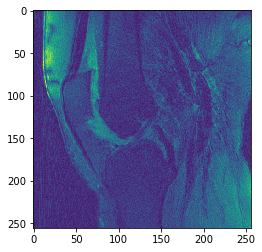

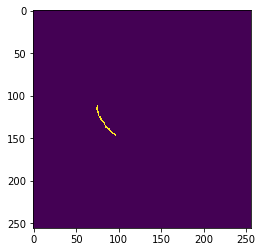

Predicted Map


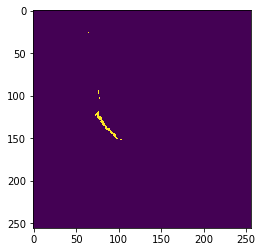

True Map


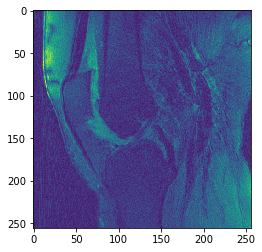

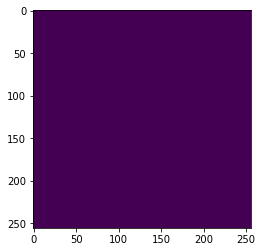

Predicted Map


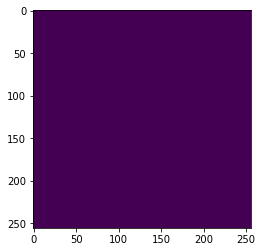

True Map


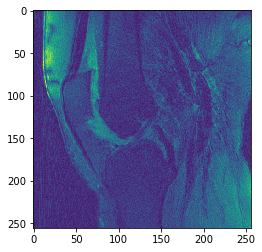

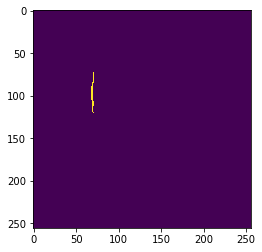

Predicted Map


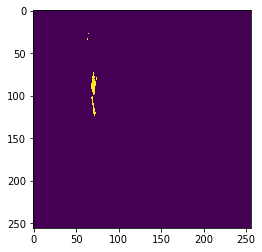

True Map


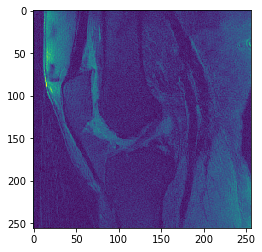

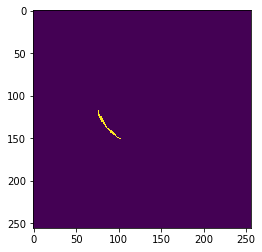

Predicted Map


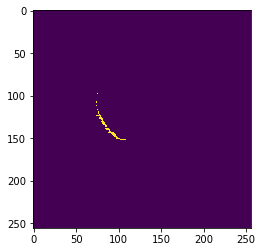

True Map


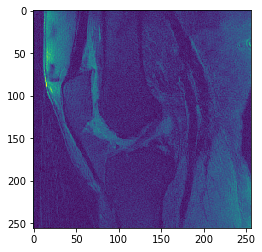

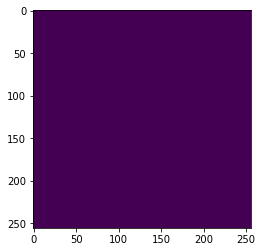

Predicted Map


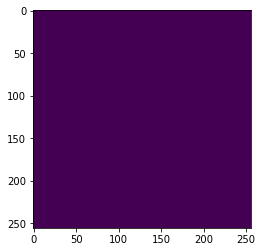

True Map


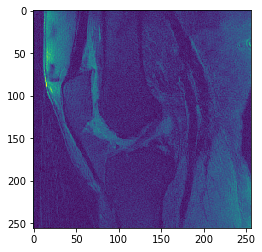

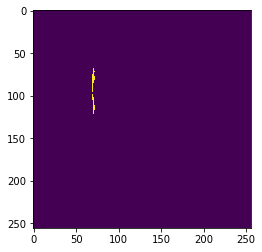

Predicted Map


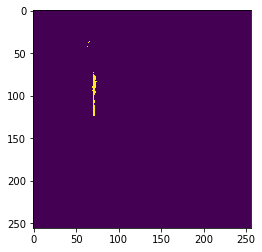

True Map


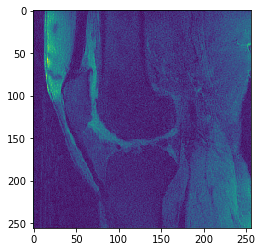

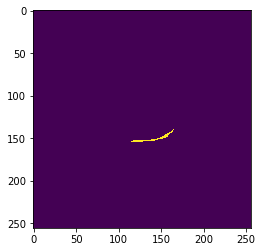

Predicted Map


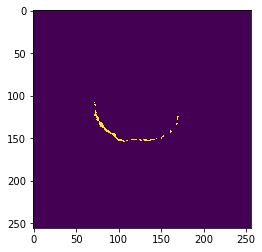

True Map


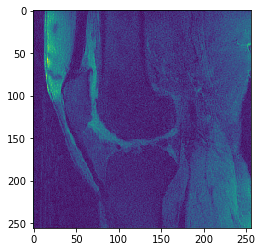

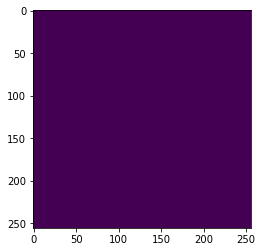

Predicted Map


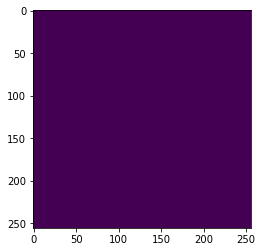

True Map


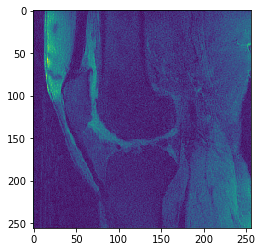

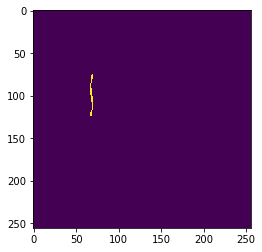

Predicted Map


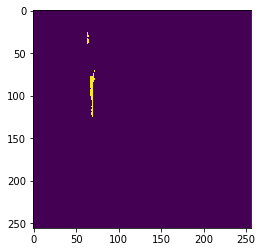

True Map


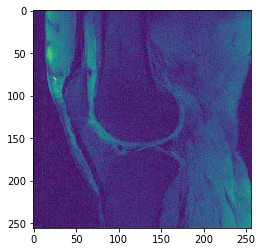

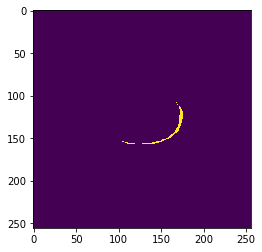

Predicted Map


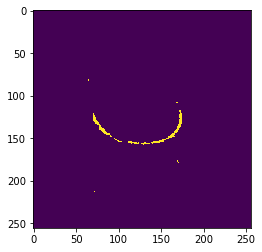

True Map


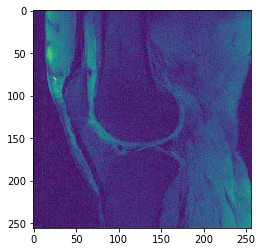

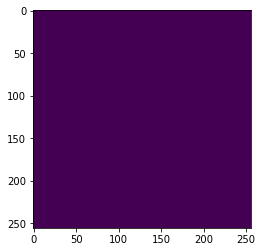

Predicted Map


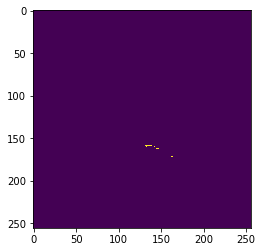

True Map


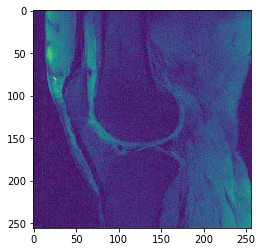

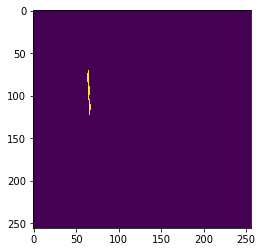

Predicted Map


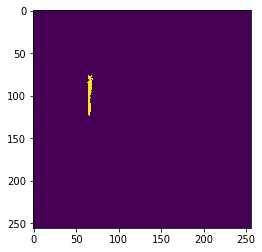

True Map


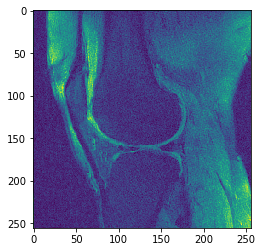

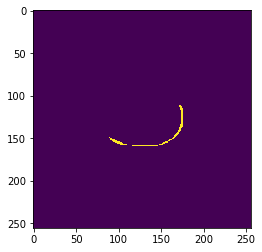

Predicted Map


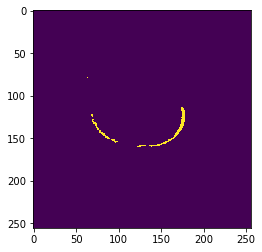

True Map


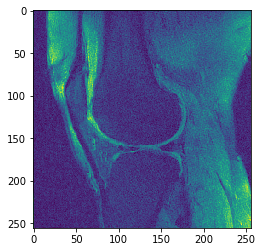

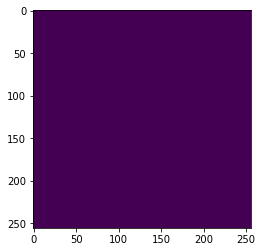

Predicted Map


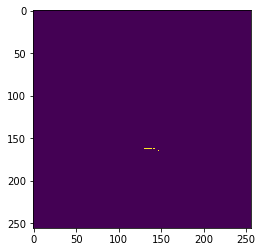

True Map


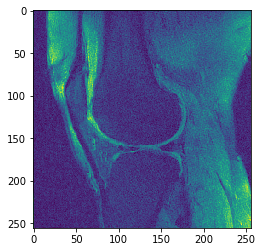

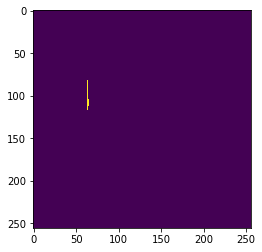

Predicted Map


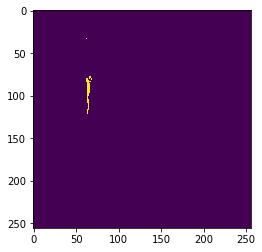

True Map


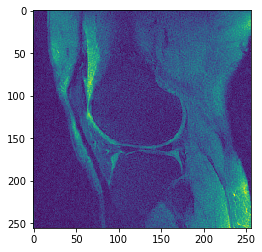

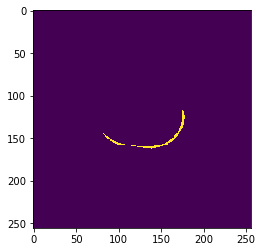

Predicted Map


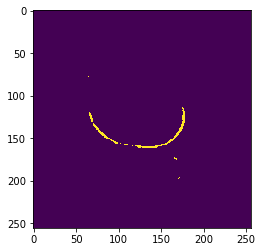

True Map


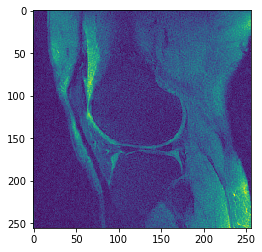

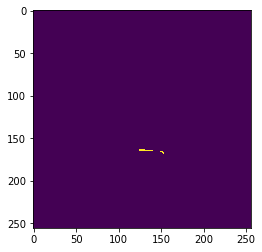

Predicted Map


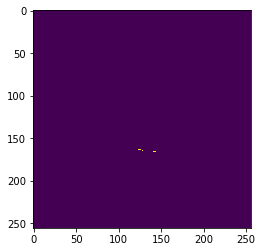

True Map


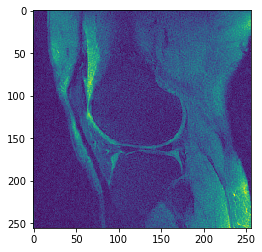

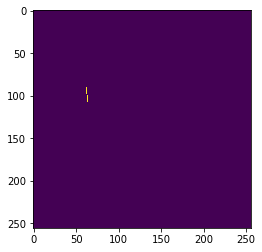

Predicted Map


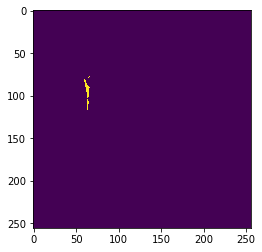

True Map


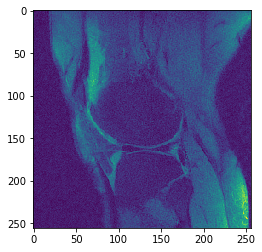

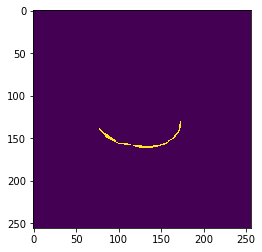

Predicted Map


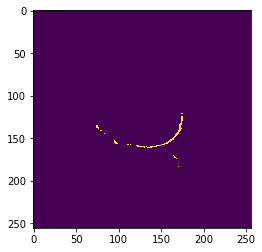

True Map


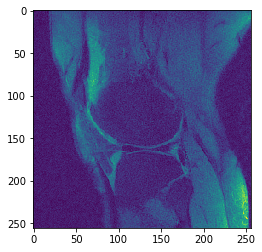

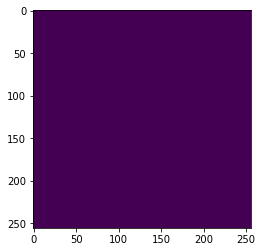

Predicted Map


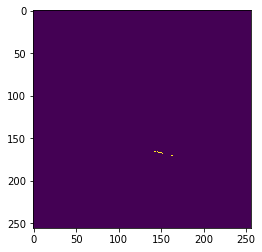

True Map


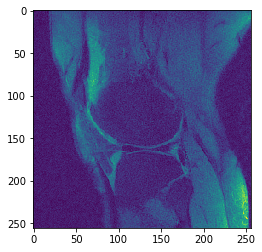

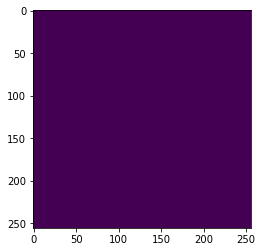

Predicted Map


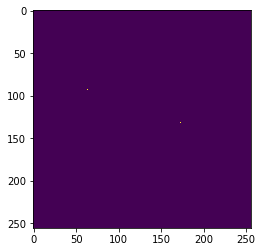

True Map


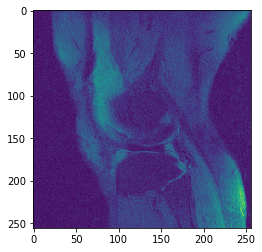

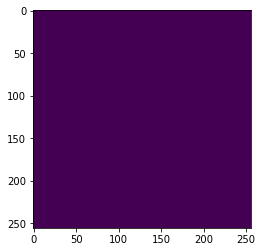

Predicted Map


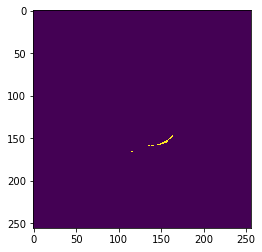

True Map


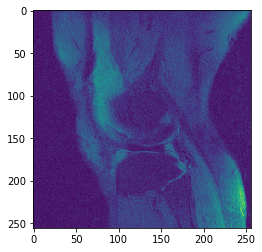

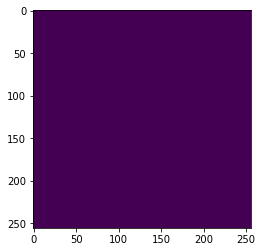

Predicted Map


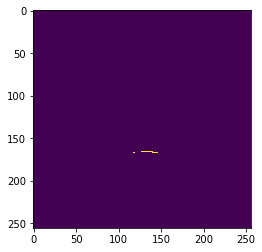

True Map


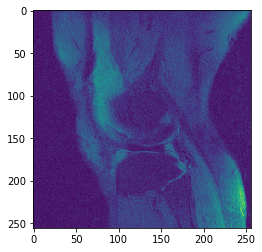

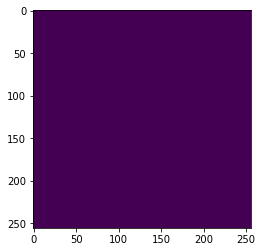

Predicted Map


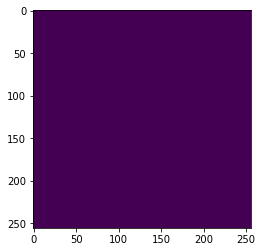

validate loss: 0.4929, Dice Score (class 0): 0.6253, Dice Score (class 1): 0.4674,Dice Score (class 2): 0.5679


(0.49285958068711416,
 0.625282666512898,
 0.46741715925080435,
 0.567856069122042)

In [27]:
evaluate_3d(vnet_model, dataloader, data_sizes, 1, 'validate')

# Discussion
As it can be seen the visualization of the predictions, we see that there is an improvement if we compare it with the 3D Unet but still the predictions are grainy and noisy and model gives very conservative prediction. The dices scores areh not that good as the 2D models. One of the reasons for this behaviour is the 3-D volume of MRI is actually not a true 3-D volume. The resolution in the depth direction is only 15 (since there are 15 slices). Hence, the 3-D volume is more of a stacking of discontinuous slices. This injects more noise than signal in the model leading the model to give grainy and noisy predictions.